# Тест агента
**наш агент** (`{BUNDLE_NAME}/agent.py (по умолчанию agent_bundle_swarm)`) vs **submission.py**

In [1]:
import importlib.util, sys, os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from kaggle_environments import make

HERE     = os.path.dirname(os.path.abspath("__file__")) if "__file__" in dir() else os.getcwd()
BUNDLE_NAME = "agent_bundle_swarm"   # ← переключатель: agent_bundle / agent_bundle_swarm
OUR_PATH = os.path.join(HERE, "agent_bundle_swarm", "agent.py")
SUB_PATH = os.path.join(HERE, "sub2.py")

def load_agent(path, name):
    spec = importlib.util.spec_from_file_location(name, path)
    mod  = importlib.util.module_from_spec(spec)
    sys.modules[name] = mod
    spec.loader.exec_module(mod)
    return mod.agent

our_agent    = load_agent(OUR_PATH, "our_agent")
strong_agent = load_agent(SUB_PATH, "sub")

SEED = 4344 # один сид на дебаг-лог + визуализацию + реванш — чтобы сопоставлять кадр <-> лог

print("our_agent   :", our_agent)
print("strong_agent:", strong_agent)
print("SEED        :", SEED)

Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_checkers


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_chess


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_connect_four


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_gin_rummy


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_go


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_goofspiel


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hearts


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hex


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_matching_pennies_3p


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_othello


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_game


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_tic_tac_toe


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_universal_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_python_repeated_pokerkit


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: OpenSpiel games skipped: 1.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    snake


our_agent   : <function agent at 0x128df7740>
strong_agent: <function agent at 0x128f23c40>
SEED        : 4344


## Дебаг-лог одного матча (наш + submission параллельно)

Запускает ОДИН матч (тот же `SEED`, что и одиночный матч ниже) с включённым
per-turn логированием для **обоих** агентов:

- наш агент → `agent_debug.log` (зоны, приоритеты, все планы,
  причины FIRE/SKIP, итоговые движения).
- submission → `submission_debug.log` (modes, policy.attack_budget,
  все построенные missions с score, итоговые movements + угаданная цель).

Управление env vars:
- `ORBIT_AGENT_LOG` / `SUB_AGENT_LOG` — пути к лог-файлам (обязательно для активации).
- `ORBIT_AGENT_LOG_PLANS_ALL=1` — все кандидатные планы нашего агента.
- `ORBIT_AGENT_LOG_FLEETS=1` / `SUB_AGENT_LOG_FLEETS=1` — дамп летящих флотов.
- `SUB_AGENT_LOG_MISSIONS_ALL=1` — все missions submission (по умолчанию top-30).

После запуска: грепай `===== TURN N` в обоих файлах и сравнивай ход за ходом.

In [2]:
OUR_LOG = os.path.join(HERE, "agent_debug.log")
SUB_LOG = os.path.join(HERE, "submission_debug.log")

# Чистая стартовая точка: перезаписываем оба лога + ставим env'ы ДО загрузки агентов.
for _p in (OUR_LOG, SUB_LOG):
    if os.path.exists(_p):
        os.remove(_p)

os.environ["ORBIT_AGENT_LOG"]            = OUR_LOG
os.environ["ORBIT_AGENT_LOG_PLANS_ALL"]  = "1"
os.environ["ORBIT_AGENT_LOG_FLEETS"]     = "0"

os.environ["SUB_AGENT_LOG"]              = SUB_LOG
os.environ["SUB_AGENT_LOG_MISSIONS_ALL"] = "0"   # 1 = ВСЕ missions, не только top-30
os.environ["SUB_AGENT_LOG_FLEETS"]       = "0"

# Перезагружаем все debug-модули + сами агенты, чтобы env-переменные
# подхватились при первом вызове (модули кешируют env-резолв).
for _modname in ("our_agent", "agent_debug", "sub", "submission_debug"):
    if _modname in sys.modules:
        del sys.modules[_modname]

import agent_debug as _adbg
_adbg.reset()
import submission_debug as _sdbg
_sdbg.reset()

our_agent_dbg = load_agent(OUR_PATH, "our_agent")

# submission нужно загрузить как модуль (а не только agent-функцию), чтобы
# submission_debug мог пропатчить Mission / build_modes / build_policy_state.
_spec = importlib.util.spec_from_file_location("sub", SUB_PATH)
sub_mod_dbg = importlib.util.module_from_spec(_spec)
sys.modules["sub"] = sub_mod_dbg
_spec.loader.exec_module(sub_mod_dbg)

strong_agent_dbg = _sdbg.wrap(sub_mod_dbg)

# ВАЖНО: тот же SEED, что и в одиночном матче ниже — лог и визуализация
# показывают РОВНО ОДИН И ТОТ ЖЕ матч.
env_dbg = make("orbit_wars", debug=False, configuration={"seed": SEED})
env_dbg.run([our_agent_dbg, strong_agent_dbg])

final_dbg = env_dbg.steps[-1]
for i, s in enumerate(final_dbg):
    label = "our" if i == 0 else "sub"
    print(f"  P{i} ({label}): reward={s.reward}  status={s.status}  (seed={SEED})")

for label, path in [("our", OUR_LOG), ("sub", SUB_LOG)]:
    size = os.path.getsize(path) if os.path.exists(path) else 0
    print(f"\nЛог [{label}]: {path}  ({size:,} байт)")
    if size:
        with open(path, "r", encoding="utf-8") as f:
            tail = f.readlines()[-30:]
        print(f"--- последние {len(tail)} строк ---")
        print("".join(tail))

# Визуализация ТОГО ЖЕ матча — можно прокликивать ходы и в каждом кадре
# грепать соответствующий `===== TURN N` в обоих лог-файлах.
env_dbg.render(mode="ipython", width=800, height=600)

  P0 (our): reward=1  status=DONE  (seed=4344)
  P1 (sub): reward=-1  status=DONE  (seed=4344)

Лог [our]: /Users/adel/Documents/GitHub/OrbitWW/agent_debug.log  (3,084,561 байт)
--- последние 30 строк ---
    20   0 frontline           +0.42     3    42       0   +327.87    +1.00   48.7     0
    11   0 mid                 +0.14     3   164       0   +438.78    +1.00   60.4     0
    10   0 mid                 +0.12     3   147       0   +431.11    +1.00   60.5     0
     8   0 mid                 +0.12     3   108       0   +355.00    +1.00   60.4     0
    15   0 frontline           +0.11     2    92       0   +269.99    +1.00   54.6     0
     5   0 mid                 +0.09     3   127       0   +367.45    +1.00   61.6     0
     7   0 mid                 +0.09     3   129       0   +401.09    +1.00   61.2     0
    13   0 mid                 +0.08     2    68       0   +341.99    +1.00   53.0     0
    14   0 mid                 +0.08     2    80       0   +384.44    +1.00   53.0 

## График: корабли и производство по ходам

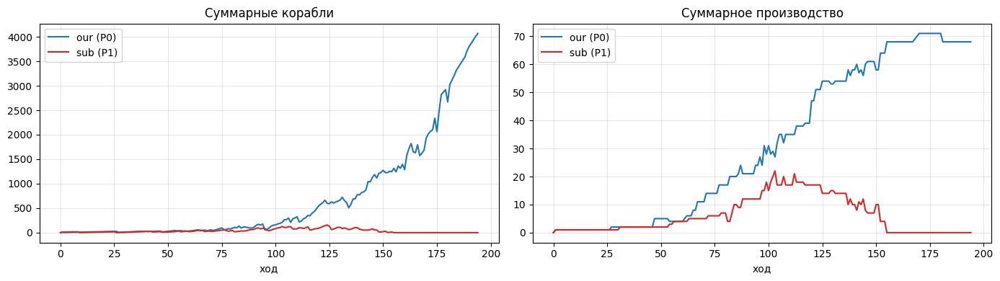

In [3]:
def extract_timeseries(env_obj, our_side=0):
    """Из env.steps достаём суммарные корабли и суммарное производство по ходам."""
    steps_data = []
    for step_idx, step in enumerate(env_obj.steps):
        obs = step[0].observation      # общее наблюдение
        planets = obs.get("planets", []) if isinstance(obs, dict) else obs.planets
        row = {"step": step_idx}
        for pid in (0, 1):
            owned = [p for p in planets if (p[1] if isinstance(p, list) else p.owner) == pid]
            row[f"ships_p{pid}"]  = sum(p[5] if isinstance(p, list) else p.ships for p in owned)
            row[f"prod_p{pid}"]   = sum(p[6] if isinstance(p, list) else p.production for p in owned)
        steps_data.append(row)
    return pd.DataFrame(steps_data)

# берём первый одиночный матч (наш P0)
ts = extract_timeseries(env_dbg, our_side=0)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

ax = axes[0]
ax.plot(ts["step"], ts["ships_p0"], label="our (P0)", color="tab:blue")
ax.plot(ts["step"], ts["ships_p1"], label="sub (P1)", color="tab:red")
ax.set_title("Суммарные корабли")
ax.set_xlabel("ход"); ax.legend(); ax.grid(alpha=0.3)

ax = axes[1]
ax.plot(ts["step"], ts["prod_p0"], label="our (P0)", color="tab:blue")
ax.plot(ts["step"], ts["prod_p1"], label="sub (P1)", color="tab:red")
ax.set_title("Суммарное производство")
ax.set_xlabel("ход"); ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


=== STRONG match x10 ===


seed=0  steps=118  LOSS   n= 0 vs 23   prod= 0 vs 59   total=   0 vs 1577


seed=1  steps=172  LOSS   n= 0 vs 26   prod= 0 vs 66   total=   0 vs 1749


seed=2  steps=173  WIN    n=34 vs  0   prod=90 vs  0   total=4214 vs    0


seed=3  steps=161  LOSS   n= 0 vs 32   prod= 0 vs 76   total=   0 vs 2458


seed=4  steps=214  WIN    n=36 vs  0   prod=84 vs  0   total=5503 vs    0


seed=5  steps=233  WIN    n=24 vs  0   prod=60 vs  0   total=3575 vs    0


seed=6  steps=279  LOSS   n= 0 vs 20   prod= 0 vs 28   total=   0 vs 1102


seed=7  steps=295  LOSS   n= 0 vs 36   prod= 0 vs 92   total=   0 vs 4298


seed=8  steps=166  LOSS   n= 0 vs 36   prod= 0 vs 100   total=   0 vs 2675


seed=9  steps=166  LOSS   n= 0 vs 28   prod= 0 vs 72   total=   0 vs 2033

winrate: 3/10 = 30%
средние (vs strong):
      steps  prod0_final  prod1_final  total0_final  total1_final
mean  197.7         23.4         49.3        1329.2        1589.2
std    56.3         38.4         39.1        2189.7        1386.8
min   118.0          0.0          0.0           0.0           0.0
max   295.0         90.0        100.0        5503.0        4298.0

=== Временные ряды для каждого матча против STRONG ===


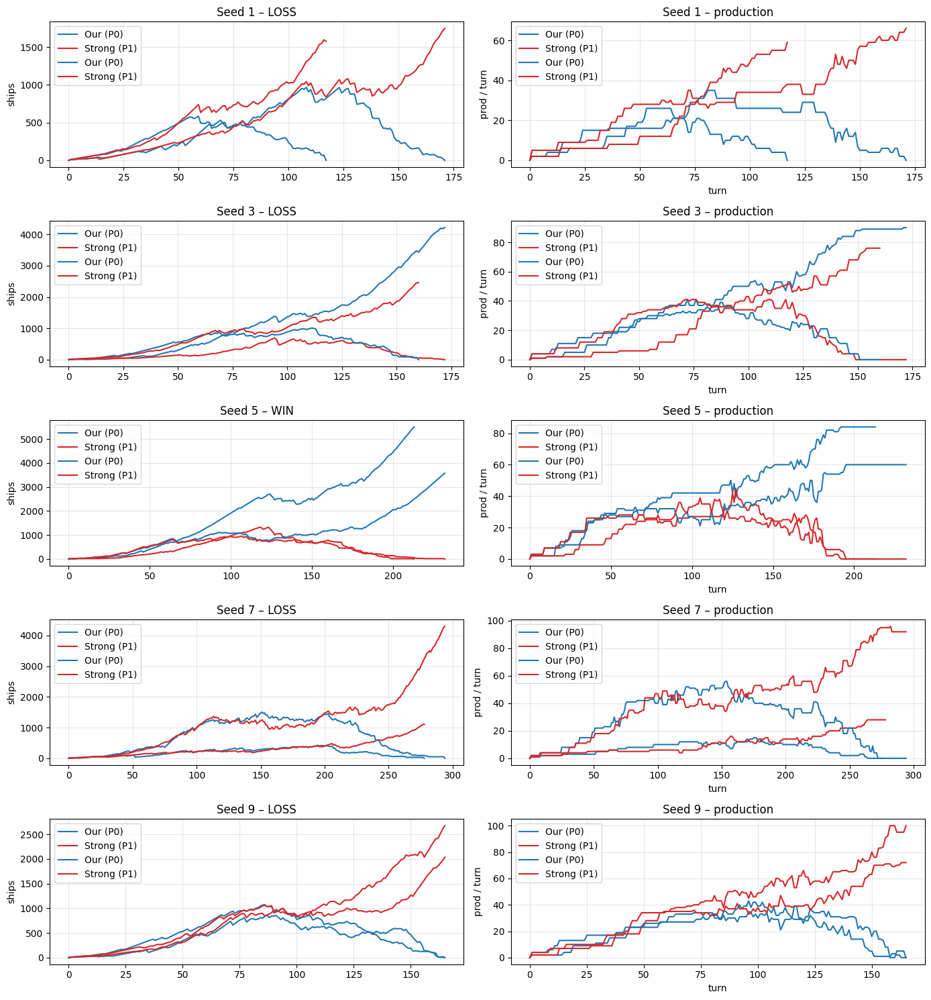

NameError: name 'noop_df' is not defined

In [ ]:
### Сбор статистики на 10 сидах: vs noop + vs strong
# Против noop: измеряем потери кораблей (gap) и кол-во чистых промахов. Чем меньше, тем лучше геометрия/K_needed.
# Против strong: реальный winrate и насколько быстро/крупно выигрываем.

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

N_SEEDS = 10
HORIZON_FOR_GAP = True  # считать gap = ideal - actual

def noop_agent(obs, config=None):
    return []

def _run_and_stats(agent_a, agent_b, seed):
    env = make("orbit_wars", debug=False, configuration={"seed": seed})
    env.run([agent_a, agent_b])
    rows = []
    initial_ships = None
    for t, state in enumerate(env.steps):
        obs = state[0].get("observation") or {}
        planets = obs.get("planets") or []
        fleets  = obs.get("fleets")  or []
        on0 = inf0 = prod0 = 0.0; n0 = 0
        on1 = inf1 = prod1 = 0.0; n1 = 0
        for raw in planets:
            p = raw if isinstance(raw, (list, tuple)) else (
                raw.get("id"), raw.get("owner"), raw.get("x"), raw.get("y"),
                raw.get("radius"), raw.get("ships"), raw.get("production"))
            if p[1] == 0:
                on0 += float(p[5] or 0); prod0 += float(p[6] or 0); n0 += 1
            elif p[1] == 1:
                on1 += float(p[5] or 0); prod1 += float(p[6] or 0); n1 += 1
        for raw in fleets:
            f = raw if isinstance(raw, (list, tuple)) else (
                raw.get("id"), raw.get("owner"), raw.get("x"), raw.get("y"),
                raw.get("angle"), raw.get("from_planet_id"), raw.get("ships"))
            if f[1] == 0: inf0 += float(f[6] or 0)
            elif f[1] == 1: inf1 += float(f[6] or 0)
        if initial_ships is None and on0 > 0:
            initial_ships = on0
        rows.append({"t": t, "on0": on0, "inf0": inf0, "prod0": prod0, "n0": n0,
                     "on1": on1, "inf1": inf1, "prod1": prod1, "n1": n1})
    df = pd.DataFrame(rows)
    df["total0"] = df.on0 + df.inf0
    df["total1"] = df.on1 + df.inf1
    df["ideal0"] = (initial_ships or 0) + df.prod0.shift(1).fillna(0).cumsum()
    df["gap0"]  = df.ideal0 - df.total0
    df["gap_diff"]  = df.gap0.diff().fillna(0)
    df["prod_diff"] = df.prod0.diff().fillna(0)
    r0 = env.steps[-1][0].get("reward")
    r1 = env.steps[-1][1].get("reward")
    return df, r0, r1


# --- STRONG: реальный winrate ---
strong_summary = []
strong_dfs = []  # <-- добавлено для хранения временных рядов
print("\n=== STRONG match x" + str(N_SEEDS) + " ===")
wins = 0
for seed in range(N_SEEDS):
    our_agent    = load_agent(OUR_PATH, "our_agent")
    strong_agent = load_agent(SUB_PATH, "sub")
    df, r0, r1 = _run_and_stats(our_agent, strong_agent, seed)
    win = 1 if (r0 is not None and r1 is not None and r0 > r1) else 0
    wins += win
    row = {
        "seed": seed,
        "steps": len(df),
        "prod0_final": float(df.prod0.iloc[-1]),
        "prod1_final": float(df.prod1.iloc[-1]),
        "n0_final": int(df.n0.iloc[-1]),
        "n1_final": int(df.n1.iloc[-1]),
        "total0_final": float(df.total0.iloc[-1]),
        "total1_final": float(df.total1.iloc[-1]),
        "reward0": r0, "reward1": r1, "win": win,
    }
    strong_summary.append(row)
    strong_dfs.append((seed, df))  # <-- сохраняем DataFrame для графиков
    print("seed=%d  steps=%3d  %s   n=%2d vs %2d   prod=%2.0f vs %2.0f   total=%4.0f vs %4.0f" %
          (seed, row["steps"], "WIN " if win else "LOSS",
           row["n0_final"], row["n1_final"],
           row["prod0_final"], row["prod1_final"],
           row["total0_final"], row["total1_final"]))

strong_df = pd.DataFrame(strong_summary)
print("\nwinrate: %d/%d = %.0f%%" % (wins, N_SEEDS, 100.0 * wins / N_SEEDS))
print("средние (vs strong):")
print(strong_df[["steps","prod0_final","prod1_final","total0_final","total1_final"]].describe().loc[["mean","std","min","max"]].round(1))

# ========== ПОСТРОЕНИЕ ВРЕМЕННЫХ РЯДОВ ДЛЯ КАЖДОГО STRONG-МАТЧА ==========
print("\n=== Временные ряды для каждого матча против STRONG ===")
if strong_dfs:
    n_matches = len(strong_dfs)
    n_cols = 2
    n_rows = math.ceil(n_matches / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, n_cols)
    
    for idx, (seed, df) in enumerate(strong_dfs):
        row = idx // n_cols
        col = idx % n_cols
        ax_left = axes[row, 0]   # корабли
        ax_right = axes[row, 1]  # производство
        
        ax_left.plot(df["t"], df["total0"], label="Our (P0)", color="tab:blue")
        ax_left.plot(df["t"], df["total1"], label="Strong (P1)", color="tab:red")
        win_status = "WIN" if strong_df.loc[idx, "win"] else "LOSS"
        ax_left.set_title(f"Seed {seed} – {win_status}")
        ax_left.set_ylabel("ships")
        ax_left.legend()
        ax_left.grid(alpha=0.3)
        
        ax_right.plot(df["t"], df["prod0"], label="Our (P0)", color="tab:blue")
        ax_right.plot(df["t"], df["prod1"], label="Strong (P1)", color="tab:red")
        ax_right.set_title(f"Seed {seed} – production")
        ax_right.set_xlabel("turn")
        ax_right.set_ylabel("prod / turn")
        ax_right.legend()
        ax_right.grid(alpha=0.3)
    
    if n_matches % n_cols != 0:
        axes[-1, -1].axis("off")
    
    plt.tight_layout()
    plt.show()
else:
    print("Нет данных для построения временных рядов.")

# Сохранение (опционально)
out_noop = os.path.join(HERE, "out", "seeds_noop_summary.csv")
out_strong = os.path.join(HERE, "out", "seeds_strong_summary.csv")
import os
os.makedirs(os.path.dirname(out_noop), exist_ok=True)
noop_df.to_csv(out_noop, index=False)
strong_df.to_csv(out_strong, index=False)
print("\n" + "="*60)
print("сохранено:")
print("  " + out_noop)
print("  " + out_strong)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Загрузка данных (укажите правильный путь к файлу)
df = pd.read_csv('zones_grid_20260428_011428.csv')

# Убедимся, что колонки с весами – числовые
for col in ['w_wnn_close_res', 'w_mean_dist_all', 'w_ships']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 1. Агрегация по уникальной конфигурации параметров
group_cols = ['w_wnn_close_res', 'w_mean_dist_all', 'w_ships']
agg = df.groupby(group_cols).agg(
    winrate=('win', 'mean'),
    count=('win', 'count'),
    steps_mean=('steps', 'mean'),
    steps_std=('steps', 'std'),
    ships_our_mean=('ships_our_final', 'mean'),
    ships_sub_mean=('ships_sub_final', 'mean'),
    n_our_mean=('n_our_final', 'mean'),
    n_sub_mean=('n_sub_final', 'mean'),
    time_mean=('match_time_sec', 'mean')
).reset_index()

print("=== Winrate по конфигурациям (первые 10 строк) ===")
print(agg.head(10))
print(f"\nОбщий winrate: {df['win'].mean():.1%}")

# 2. Тепловая карта winrate (усредняя по w_wnn_close_res или показывая фасетки)
# Для простоты усредним по w_wnn_close_res и построим тепловую карту по двум оставшимся параметрам
pivot = agg.pivot_table(index='w_mean_dist_all', columns='w_ships', values='winrate', aggfunc='mean')
plt.figure(figsize=(10, 6))
sns.heatmap(pivot, annot=True, cmap='RdYlGn', center=0.5, vmin=0, vmax=1, fmt='.2f')
plt.title('Winrate (усреднён по w_wnn_close_res)')
plt.xlabel('w_ships')
plt.ylabel('w_mean_dist_all')
plt.tight_layout()
plt.show()

# 3. Распределение количества ходов по разным w_ships (можно выбрать любой параметр)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.boxplot(data=df, x='w_ships', y='steps', palette='viridis')
plt.title('Длительность матча vs w_ships')
plt.subplot(1, 2, 2)
sns.boxplot(data=df, x='w_ships', y='ships_our_final', palette='viridis')
plt.yscale('log')
plt.title('Финальные корабли (наши) vs w_ships')
plt.tight_layout()
plt.show()

# 4. Сравнение средних финальных кораблей нашего агента и противника
# Сгруппируем по всем трём параметрам, но для наглядности преобразуем в факторы
df['param_group'] = df['w_wnn_close_res'].astype(str) + ', ' + df['w_mean_dist_all'].astype(str) + ', ' + df['w_ships'].astype(str)
# Ограничим число уникальных групп для читаемости (выберем топ-10 по встречаемости)
top_groups = df['param_group'].value_counts().head(10).index
df_top = df[df['param_group'].isin(top_groups)]
df_melt = df_top.melt(id_vars='param_group', value_vars=['ships_our_final', 'ships_sub_final'],
                      var_name='Agent', value_name='Ships')
plt.figure(figsize=(12, 6))
sns.barplot(data=df_melt, x='param_group', y='Ships', hue='Agent', palette=['blue', 'red'])
plt.xticks(rotation=45, ha='right')
plt.title('Сравнение финальных кораблей (топ-10 конфигураций)')
plt.ylabel('Количество кораблей')
plt.tight_layout()
plt.show()

# 5. Зависимость winrate от w_ships при разных w_mean_dist_all (линейные графики)
plt.figure(figsize=(10, 6))
for dist in sorted(df['w_mean_dist_all'].unique()):
    subset = agg[agg['w_mean_dist_all'] == dist]
    plt.plot(subset['w_ships'], subset['winrate'], marker='o', label=f'mean_dist={dist}')
plt.xlabel('w_ships')
plt.ylabel('Winrate')
plt.title('Winrate в зависимости от w_ships и w_mean_dist_all (усреднён по w_wnn_close_res)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 6. Дополнительно: гистограмма времени выполнения матча
plt.figure(figsize=(8, 4))
plt.hist(df['match_time_sec'], bins=30, edgecolor='black', alpha=0.7)
plt.xlabel('Время матча (сек)')
plt.ylabel('Частота')
plt.title('Распределение длительности матчей')
plt.show()

## Сводная таблица серии

In [ ]:
total = len(df_res)
wins  = (df_res["outcome"] == "win").sum()
losses= (df_res["outcome"] == "loss").sum()
draws = (df_res["outcome"] == "draw").sum()

summary = pd.DataFrame([
    {"метрика": "матчей всего",   "значение": total},
    {"метрика": "побед",          "значение": wins},
    {"метрика": "поражений",      "значение": losses},
    {"метрика": "ничьих",         "значение": draws},
    {"метрика": "win rate",       "значение": f"{wins/total*100:.1f}%"},
    {"метрика": "avg reward our", "значение": f"{df_res['reward_our'].mean():.4f}"},
    {"метрика": "avg reward sub", "значение": f"{df_res['reward_sub'].mean():.4f}"},
])

display(summary.set_index("метрика"))
display(df_res)